<a href="https://colab.research.google.com/github/aycayk/classification_of_gravitational_waves/blob/main/Lunar_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r ./Sam_LoRA ./drive/MyDrive/

In [ ]:
!nvidia-smi

Fri Dec 27 17:42:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install kagglehub

In [ ]:
!kaggle datasets download -d romainpessia/artificial-lunar-rocky-landscape-dataset

Dataset URL: https://www.kaggle.com/datasets/romainpessia/artificial-lunar-rocky-landscape-dataset
License(s): CC-BY-NC-SA-4.0
 99% 5.00G/5.02G [00:42<00:00, 149MB/s]
100% 5.02G/5.02G [00:42<00:00, 126MB/s]


datayı drvie a yükle


In [ ]:
import zipfile
import os
import shutil

zip_path = "/content/artificial-lunar-rocky-landscape-dataset.zip"

extract_path = "/content/lunar_dataset"

target_directories = {
    "ground": "/content/drive/MyDrive/comp/image/GROUND",
    "render": "/content/drive/MyDrive/comp/image/RENDER",
    "clean": "/content/drive/MyDrive/comp/image/CLEAN",
}

for key, target_directory in target_directories.items():
    os.makedirs(target_directory, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    all_files = zip_ref.namelist()

    for folder in target_directories.keys():
        folder_files = [f for f in all_files if f.startswith(f"images/{folder}")]

        print(f"'images/{folder}' içinde bulunan dosya sayısı: {len(folder_files)}")

        for file in folder_files:
            zip_ref.extract(file, extract_path)

        source_directory = os.path.join(extract_path, f"images/{folder}")

        moved_count = 0
        for filename in os.listdir(source_directory):
            source_path = os.path.join(source_directory, filename)
            target_path = os.path.join(target_directories[folder], filename)
            shutil.move(source_path, target_path)
            moved_count += 1

        print(f"'images/{folder}' içindeki {moved_count} dosya '{target_directories[folder]}' dizinine taşındı.\n")

'images/ground' içinde bulunan dosya sayısı: 9766
'images/ground' içindeki 9766 dosya '/content/drive/MyDrive/comp/image/GROUND' dizinine taşındı.

'images/render' içinde bulunan dosya sayısı: 9766
'images/render' içindeki 9766 dosya '/content/drive/MyDrive/comp/image/RENDER' dizinine taşındı.

'images/clean' içinde bulunan dosya sayısı: 9766
'images/clean' içindeki 9766 dosya '/content/drive/MyDrive/comp/image/CLEAN' dizinine taşındı.



dataset oluşturma ve iismleri eşleme

In [ ]:
import os
import shutil

render_dir = "/content/drive/MyDrive/comp/image/RENDER"
output_dir = "/content/drive/MyDrive/comp/dataset/image"

# Hedef klasörü oluştur
os.makedirs(output_dir, exist_ok=True)

# RENDER klasöründeki görüntü dosyalarını filtrele
render_files = sorted(f for f in os.listdir(render_dir) if f.endswith((".png", ".jpg", ".jpeg")))

# Dosyaları hedef klasöre kopyala
for render_file in render_files:
    source_path = os.path.join(render_dir, render_file)
    target_path = os.path.join(output_dir, render_file)

    shutil.copy(source_path, target_path)
    print(f"{render_file} dosyası {output_dir} klasörüne kopyalandı.")

print(f"Tüm dosyalar başarıyla {output_dir} klasörüne kaydedildi!")

In [ ]:
import os
import shutil

render_dir = "/content/drive/MyDrive/comp/image/RENDER"
ground_dir = "/content/drive/MyDrive/comp/image/GROUND"
output_dir = "/content/drive/MyDrive/comp/dataset/image"

os.makedirs(output_dir, exist_ok=True)

ground_files = sorted(f for f in os.listdir(ground_dir) if f.endswith((".png", ".jpg", ".jpeg")))

render_files = sorted(f for f in os.listdir(render_dir) if f.endswith((".png", ".jpg", ".jpeg")))

for ground_file, render_file in zip(ground_files, render_files):
    source_path = os.path.join(render_dir, render_file)
    target_path = os.path.join(output_dir, ground_file)

    shutil.copy(source_path, target_path)
    print(f"{render_file} dosyası {ground_file} olarak yeniden adlandırıldı ve kaydedildi.")

print(f"Tüm dosyalar başarıyla {output_dir} klasörüne kaydedildi!")

Streaming output truncated to the last 5000 lines.
render4768.png dosyası ground4768.png olarak yeniden adlandırıldı ve kaydedildi.
render4769.png dosyası ground4769.png olarak yeniden adlandırıldı ve kaydedildi.
render4770.png dosyası ground4770.png olarak yeniden adlandırıldı ve kaydedildi.
render4771.png dosyası ground4771.png olarak yeniden adlandırıldı ve kaydedildi.
render4772.png dosyası ground4772.png olarak yeniden adlandırıldı ve kaydedildi.
render4773.png dosyası ground4773.png olarak yeniden adlandırıldı ve kaydedildi.
render4774.png dosyası ground4774.png olarak yeniden adlandırıldı ve kaydedildi.
render4775.png dosyası ground4775.png olarak yeniden adlandırıldı ve kaydedildi.
render4776.png dosyası ground4776.png olarak yeniden adlandırıldı ve kaydedildi.
render4777.png dosyası ground4777.png olarak yeniden adlandırıldı ve kaydedildi.
render4778.png dosyası ground4778.png olarak yeniden adlandırıldı ve kaydedildi.
render4779.png dosyası ground4779.png olarak yeniden adlan

In [ ]:
import cv2
import numpy as np
import os
from tqdm import tqdm  # Progres bar göstermek için

# Kaynak ve hedef klasörler
source_folder = "/content/drive/MyDrive/comp/image/GROUND"
target_folder = "/content/drive/MyDrive/comp/dataset/mask"

# Hedef klasör yoksa oluştur
if not os.path.exists(target_folder):
    os.makedirs(target_folder)

# Renk aralıkları
green_lower = np.array([35, 100, 100])
green_upper = np.array([85, 255, 255])
blue_lower = np.array([90, 50, 50])
blue_upper = np.array([130, 255, 255])

# Klasördeki tüm görseller için döngü
image_extensions = ['.jpg', '.jpeg', '.png']
for file_name in tqdm(os.listdir(source_folder)):
    if any(file_name.lower().endswith(ext) for ext in image_extensions):
        # Görselin tam yolu
        image_path = os.path.join(source_folder, file_name)

        # Görseli oku
        image = cv2.imread(image_path)
        if image is None:
            print(f"{file_name} yüklenemedi. Atlama yapılıyor.")
            continue

        # Görseli HSV formatına çevir
        hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Maske oluştur
        green_mask = cv2.inRange(hsv, green_lower, green_upper)
        blue_mask = cv2.inRange(hsv, blue_lower, blue_upper)
        combined_mask = cv2.bitwise_or(green_mask, blue_mask)

        # Maskeyi beyaz renk ile göster
        white_mask = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2BGR)
        white_mask[combined_mask > 0] = [255, 255, 255]

        # Maskeyi hedef klasöre kaydet
        mask_name = f"{file_name}"
        target_path = os.path.join(target_folder, mask_name)
        cv2.imwrite(target_path, white_mask)

print("Tüm görsellerin maskeleri başarıyla oluşturuldu ve kaydedildi.")


100%|██████████| 9766/9766 [08:19<00:00, 19.57it/s]

Tüm görsellerin maskeleri başarıyla oluşturuldu ve kaydedildi.


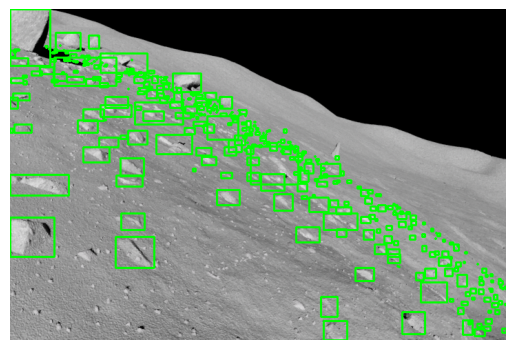

In [ ]:
import cv2
import numpy as np
import os

# Mask ve görüntü klasörlerinin yolu
image_folder = "/content/drive/MyDrive/comp/dataset/image"
mask_folder = "/content/drive/MyDrive/comp/dataset/mask"

# Tek bir dosya seçin (mask klasöründen bir dosya adı girin)
mask_file = "/content/drive/MyDrive/comp/dataset/mask/ground0039.png"  # Test edeceğiniz mask dosyasının adını buraya yazın
image_file = "/content/drive/MyDrive/comp/dataset/image/ground0039.png"  # Aynı isme sahip görüntü dosyasının adını buraya yazın

# Mask ve ilgili görüntü dosyasının tam yolu
mask_path = os.path.join(mask_folder, mask_file)
image_path = os.path.join(image_folder, image_file)

# Mask ve görüntüyü yükleyin
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
image = cv2.imread(image_path)

# Maskeyi ikili (binary) hale getirin
_, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

# Konturları bulun
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Her bir kontur için sınırlayıcı kutu oluşturun
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    # Görüntü üzerinde sınırlayıcı kutuyu çizin
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

from matplotlib import pyplot as plt
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()



In [ ]:
import cv2
import numpy as np
import os

# Mask ve görüntü klasörlerinin yolu
image_folder = "/content/drive/MyDrive/comp/dataset/image"
mask_folder = "/content/drive/MyDrive/comp/dataset/mask"

# Bounding box'ların kaydedileceği klasör
output_folder = "/content/drive/MyDrive/comp/dataset/label"
os.makedirs(output_folder, exist_ok=True)

# Mask klasöründeki tüm dosyaları listele
mask_files = os.listdir(mask_folder)

# Tüm mask dosyalarını işle
for mask_file in mask_files:
    # Dosya uzantısını kontrol et (sadece PNG ve JPG dosyaları işlenecek)
    if not (mask_file.endswith(".png") or mask_file.endswith(".jpg")):
        continue

    # Mask ve ilgili görüntü dosyasının yolu
    mask_path = os.path.join(mask_folder, mask_file)
    image_path = os.path.join(image_folder, mask_file)

    # Mask ve görüntüyü yükle
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.imread(image_path)

    # Dosya yüklenemezse atla
    if mask is None or image is None:
        print(f"Warning: Could not load {mask_file}")
        continue

    # Görüntü boyutlarını al
    height, width = mask.shape[:2]

    # Maskeyi binary hale getir
    _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    # Konturları bul
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Bounding box koordinatlarını kaydetmek için txt dosyası oluştur
    output_txt = os.path.join(output_folder, mask_file.replace(".png", ".txt").replace(".jpg", ".txt"))
    with open(output_txt, "w") as f:
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)

            # YOLO formatına dönüştür (normalize et)
            x_center = (x + w / 2) / width
            y_center = (y + h / 2) / height
            norm_width = w / width
            norm_height = h / height

            # Class ID = 0 (tek sınıf olduğunu varsayıyoruz)
            f.write(f"0 {x_center} {y_center} {norm_width} {norm_height}\n")

    print(f"Processed: {mask_file} -> {output_txt}")



Processed: ground0902.png -> /content/drive/MyDrive/comp/dataset/label/ground0902.txt


KeyboardInterrupt: 

işlem çok uzun sürdüğü iin bir yerden sonra kestim(2 saaat)

In [ ]:
import os

# Çıktı klasörünün yolu
output_folder = "/content/drive/MyDrive/comp/dataset/label"

# Tüm .txt dosyalarını listele
txt_files = [f for f in os.listdir(output_folder) if f.endswith(".txt")]

# Kaç tane dosya üretildiğini göster
print(f"Toplam {len(txt_files)} adet .txt dosyası üretildi.")


Toplam 3300 adet .txt dosyası üretildi.


3300 label üretildiği için mask ve image leri tekrar düzenledim

In [ ]:
import os
import shutil
from tqdm import tqdm

# Klasör yolları
label_folder = "/content/drive/MyDrive/comp/dataset/label"
mask_folder = "/content/drive/MyDrive/comp/dataset/mask"
image_folder = "/content/drive/MyDrive/comp/dataset/image"

new_mask_folder = "/content/drive/MyDrive/comp/dataset/new_mask"
new_image_folder = "/content/drive/MyDrive/comp/dataset/new_image"

# Yeni klasörleri oluşturma
os.makedirs(new_mask_folder, exist_ok=True)
os.makedirs(new_image_folder, exist_ok=True)

# Label dosyalarının isimlerini al
label_files = set(os.path.splitext(f)[0] for f in os.listdir(label_folder) if f.endswith(".txt"))

# Dosyaları işleme fonksiyonu
def copy_matching_files(source_folder, dest_folder, label_files, desc):
    files_to_copy = [f for f in os.listdir(source_folder) if os.path.splitext(f)[0] in label_files]
    for file in tqdm(files_to_copy, desc=desc, unit="file"):
        src = os.path.join(source_folder, file)
        dst = os.path.join(dest_folder, file)
        shutil.copy(src, dst)

# Mask ve Image klasörlerini işlem
print("Dosyalar kopyalanıyor...")
copy_matching_files(mask_folder, new_mask_folder, label_files, "Mask Files")
copy_matching_files(image_folder, new_image_folder, label_files, "Image Files")

print("Tüm eşleşen dosyalar başarıyla kopyalandı.")


Dosyalar kopyalanıyor...


Image Files: 100%|██████████| 3300/3300 [20:37<00:00,  2.67file/s]

Tüm eşleşen dosyalar başarıyla kopyalandı.


In [ ]:
import os

# Klasör yolları
label_folder = "/content/drive/MyDrive/comp/dataset/label"
mask_folder = "/content/drive/MyDrive/comp/dataset/mask"
image_folder = "/content/drive/MyDrive/comp/dataset/image"
new_mask_folder = "/content/drive/MyDrive/comp/dataset/new_mask"
new_image_folder = "/content/drive/MyDrive/comp/dataset/new_image"

# Klasördeki dosya sayılarını hesaplama
def count_files(folder, extension=None):
    if extension:
        return len([f for f in os.listdir(folder) if f.endswith(extension)])
    return len(os.listdir(folder))

# Ana klasörlerdeki toplam dosya sayıları
print("Orijinal Klasörlerdeki Dosya Sayıları:")
print(f"Label klasörü: {count_files(label_folder, '.txt')} adet dosya")
print(f"Mask klasörü: {count_files(mask_folder, '.png')} adet dosya")
print(f"Image klasörü: {count_files(image_folder, '.png')} adet dosya")

# Yeni klasörlerdeki toplam dosya sayıları
print("\nYeni Klasörlerdeki Dosya Sayıları:")
print(f"New Mask klasörü: {count_files(new_mask_folder)} adet dosya")
print(f"New Image klasörü: {count_files(new_image_folder)} adet dosya")

# Eşleşen dosyaların doğruluğunu kontrol etme
label_files = set(os.path.splitext(f)[0] for f in os.listdir(label_folder) if f.endswith(".txt"))

new_mask_files = set(os.path.splitext(f)[0] for f in os.listdir(new_mask_folder))
new_image_files = set(os.path.splitext(f)[0] for f in os.listdir(new_image_folder))

# Eşleşme doğrulama
mask_match = label_files == new_mask_files
image_match = label_files == new_image_files

print("\nEşleşme Kontrolü:")
print(f"Mask klasörü eşleşmesi: {'Başarılı' if mask_match else 'Hatalı'}")
print(f"Image klasörü eşleşmesi: {'Başarılı' if image_match else 'Hatalı'}")

# Eşleşmeyen dosyaları gösterme
if not mask_match:
    print("\nEşleşmeyen Mask Dosyaları:")
    print(label_files - new_mask_files)

if not image_match:
    print("\nEşleşmeyen Image Dosyaları:")
    print(label_files - new_image_files)


Orijinal Klasörlerdeki Dosya Sayıları:
Label klasörü: 3300 adet dosya
Mask klasörü: 9766 adet dosya
Image klasörü: 9766 adet dosya

Yeni Klasörlerdeki Dosya Sayıları:
New Mask klasörü: 3300 adet dosya
New Image klasörü: 3300 adet dosya

Eşleşme Kontrolü:
Mask klasörü eşleşmesi: Başarılı
Image klasörü eşleşmesi: Başarılı


train - test dataset oluşturma

In [ ]:
import os
import shutil
import random
from tqdm import tqdm  # İlerleme çubuğu için

# Mevcut klasör yolları
image_dir = "/content/drive/MyDrive/dataset/image"
mask_dir = "/content/drive/MyDrive/dataset/mask"
label_dir = "/content/drive/MyDrive/dataset/label"

# Yeni train ve test klasörlerini tanımlayın
train_dir = "/content/drive/MyDrive/train"
test_dir = "/content/drive/MyDrive/test"

# Yeni klasörleri oluşturun
for folder in ["image", "mask", "label"]:
    os.makedirs(os.path.join(train_dir, folder), exist_ok=True)
    os.makedirs(os.path.join(test_dir, folder), exist_ok=True)

# Tüm görüntü dosyalarını listele
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
random.shuffle(image_files)  # Dosyaları karıştır

# Eğitim ve test oranını belirle (%80 eğitim, %20 test)
split_index = int(0.8 * len(image_files))
train_files = image_files[:split_index]
test_files = image_files[split_index:]

# Eksik dosyaları izlemek için listeler
missing_masks = []
missing_labels = []

def move_files(files, split):
    """Görüntü, maske ve label dosyalarını taşır."""
    for image_file in tqdm(files, desc=f"{split.capitalize()} Seti Taşınıyor", ncols=100):
        # Kaynak dosyalar
        image_path = os.path.join(image_dir, image_file)
        mask_file = os.path.splitext(image_file)[0] + ".png"
        mask_path = os.path.join(mask_dir, mask_file)
        label_file = os.path.splitext(image_file)[0] + ".txt"
        label_path = os.path.join(label_dir, label_file)

        # Hedef klasörler
        target_image_dir = os.path.join(train_dir if split == "train" else test_dir, "image")
        target_mask_dir = os.path.join(train_dir if split == "train" else test_dir, "mask")
        target_label_dir = os.path.join(train_dir if split == "train" else test_dir, "label")

        # Görüntü dosyasını taşı
        shutil.copy(image_path, os.path.join(target_image_dir, image_file))

        # Maske dosyasını taşı
        if os.path.exists(mask_path):
            shutil.copy(mask_path, os.path.join(target_mask_dir, mask_file))
        else:
            missing_masks.append(mask_path)

        # Label dosyasını taşı
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(target_label_dir, label_file))
        else:
            missing_labels.append(label_path)

# Train setini taşı
move_files(train_files, "train")

# Test setini taşı
move_files(test_files, "test")

print("\nVeri seti başarıyla bölündü!")

# Eksik dosyaları raporla
if missing_masks or missing_labels:
    print(f"Toplam {len(missing_masks)} maske eksik:")
    print("\n".join(missing_masks))
    print(f"Toplam {len(missing_labels)} label eksik:")
    print("\n".join(missing_labels))
else:
    print("Tüm dosyalar eksiksiz taşındı!")


Test Seti Taşınıyor: 100%|████████████████████████████████████████| 660/660 [10:30<00:00,  1.05it/s]


Veri seti başarıyla bölündü!
Tüm dosyalar eksiksiz taşındı!


eğitim

In [ ]:
!pip install poetry

In [ ]:
!rm -rf Sam_LoRA

In [ ]:
!git clone https://github.com/MathieuNlp/Sam_LoRA.git

Cloning into 'Sam_LoRA'...
remote: Enumerating objects: 1724, done.
remote: Counting objects: 100% (319/319), done.
remote: Compressing objects: 100% (191/191), done.
remote: Total 1724 (delta 128), reused 197 (delta 125), pack-reused 1405 (from 1)
Receiving objects: 100% (1724/1724), 177.61 MiB | 24.29 MiB/s, done.
Resolving deltas: 100% (945/945), done.
Updating files: 100% (123/123), done.


In [ ]:
import os
os.chdir("/content/drive/MyDrive/Sam_LoRA/Sam_LoRA")

In [ ]:
!poetry config virtualenvs.in-project false

In [ ]:
!poetry install --all-extras

Creating virtualenv sam-lora-poetry-mRFtLhGl-py3.10 in /root/.cache/pypoetry/virtualenvs
Installing dependencies from lock file

Package operations: 71 installs, 1 update, 0 removals

  - Installing attrs (23.1.0): Pending...
  - Installing exceptiongroup (1.1.3): Pending...
  - Installing idna (3.4): Pending...
  - Installing rpds-py (0.10.3): Pending...
  - Installing sniffio (1.3.0): Pending...
  - Installing sniffio (1.3.0): Downloading... 0%
  - Installing sniffio (1.3.0): Downloading... 100%
  - Installing sniffio (1.3.0): Installing...
  - Installing sniffio (1.3.0)
  - Installing exceptiongroup (1.1.3): Pending...
  - Installing idna (3.4): Pending...
  - Installing rpds-py (0.10.3): Pending...
  - Installing sniffio (1.3.0)
  - Installing attrs (23.1.0): Downloading... 0%
  - Installing exceptiongroup (1.1.3): Pending...
  - Installing idna (3.4): Pending...
  - Installing rpds-py (0.10.3): Pending...
  - Installing sniffio (1.3.0)
  - Installing exceptiongroup (1.1.3): Pendin

In [ ]:
!poetry run pip install --upgrade torch torchvision gradio safetensors opencv-python

  Using cached tomlkit-0.13.2-py3-none-any.whl.metadata (2.7 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.4/906.4 MB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 142.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 148.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 70.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1

In [ ]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

--2024-12-19 07:54:16--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.7.38, 13.35.7.82, 13.35.7.50, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.7.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘sam_vit_b_01ec64.pth’

sam_vit_b_01ec64.pt 100%[===================>] 357.67M   105MB/s    in 4.2s    

2024-12-19 07:54:21 (85.6 MB/s) - ‘sam_vit_b_01ec64.pth’ saved [375042383/375042383]



In [ ]:
import torch
print("CUDA Mevcut mu?", torch.cuda.is_available())  # True olmalı
print("CUDA Sürümü:", torch.version.cuda)  # CUDA sürümünü gösterir
print("PyTorch Sürümü:", torch.__version__)  # PyTorch sürümünü gösterir


CUDA Mevcut mu? True
CUDA Sürümü: 12.1
PyTorch Sürümü: 2.5.1+cu121


train

In [ ]:
!poetry run python /content/drive/MyDrive/Sam_LoRA/Sam_LoRA/train.py

/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/src/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)
config_file: {'DATAS

json dosyası

In [ ]:
import os
import json

def create_dataset_json(data_dir, bbox=None):
    """
    Dataset JSON oluşturur.

    Args:
        data_dir: Eğitim ve test verilerinin bulunduğu ana dizin.
        bbox: Varsayılan bounding box değeri [x_min, y_min, x_max, y_max]. Eğer belirtilmezse None.

    Returns:
        Dataset JSON formatında bir Python dictionary.
    """
    dataset = {
        "train": {},
        "test": {}
    }

    for split in ["train", "test"]:
        images_dir = os.path.join(data_dir, split, "image")
        masks_dir = os.path.join(data_dir, split, "mask")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"{split} seti için gerekli dizinler bulunamadı: {images_dir} veya {masks_dir}")
            continue

        image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]

        if not image_files:
            print(f"{split} seti için '{images_dir}' altında dosya bulunamadı.")
            continue

        for image_filename in image_files:
            image_path = os.path.join(images_dir, image_filename)
            mask_path = os.path.join(masks_dir, image_filename.replace('.jpg', '.png'))

            if bbox is None:
                bbox = [0, 0, 2600, 2128]

            dataset[split][image_filename] = {
                "image_path": image_path,
                "mask_path": mask_path,
                "bbox": bbox
            }

    return dataset

data_folder = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset"

dataset_json = create_dataset_json(data_folder, bbox=[250, 250, 1720, 2090])

output_json_path = os.path.join(data_folder, "dataset.json")
with open(output_json_path, "w") as json_file:
    json.dump(dataset_json, json_file, indent=4)

print(f"JSON oluşturuldu ve {output_json_path} konumuna kaydedildi.")


JSON oluşturuldu ve /content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/dataset.json konumuna kaydedildi.


tahmin modeli

<ipython-input-34-ab9aa80f6ac4>:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(15, 15))


ValueError: zero-size array to reduction operation minimum which has no identity

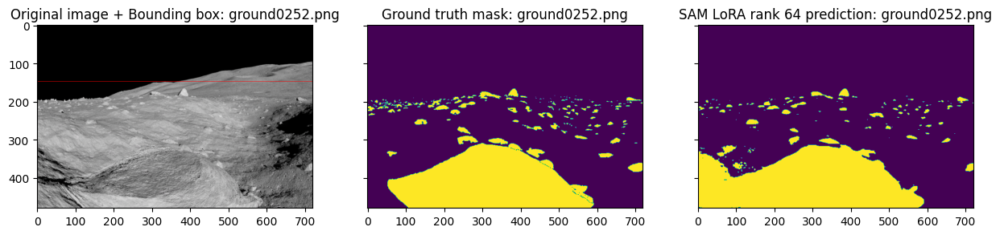

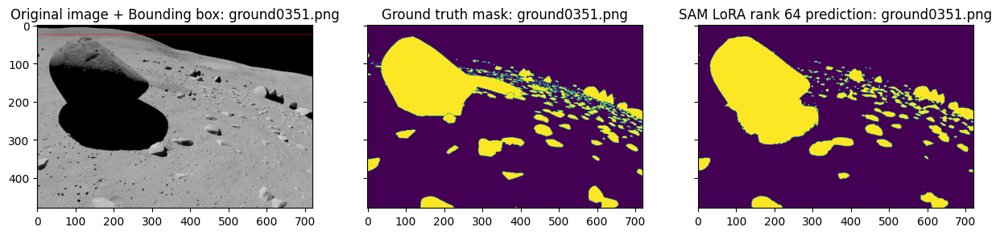

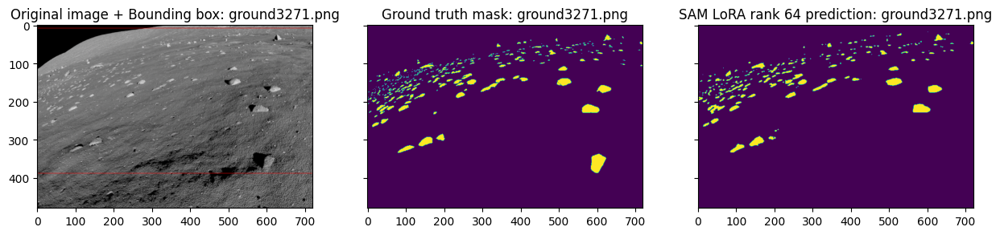

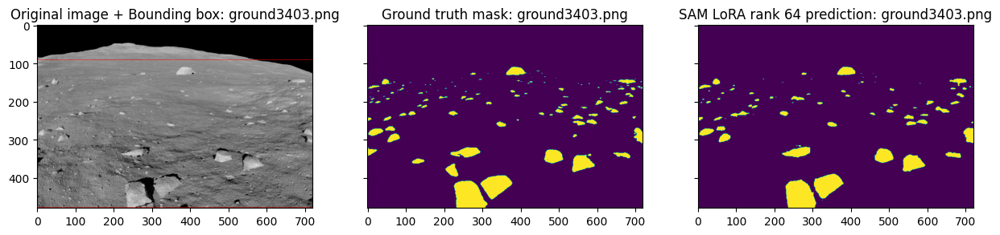

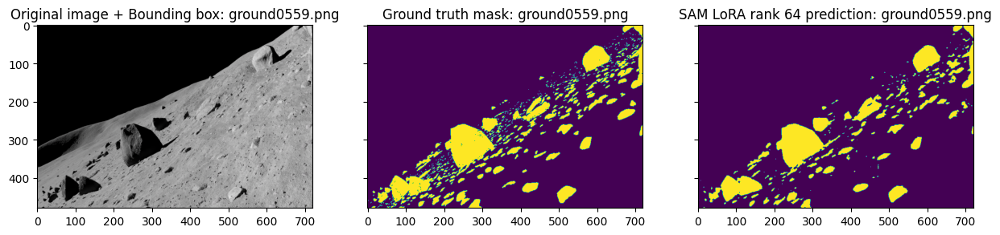

...

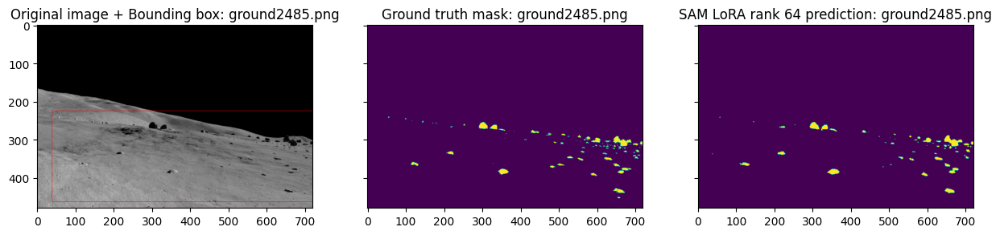

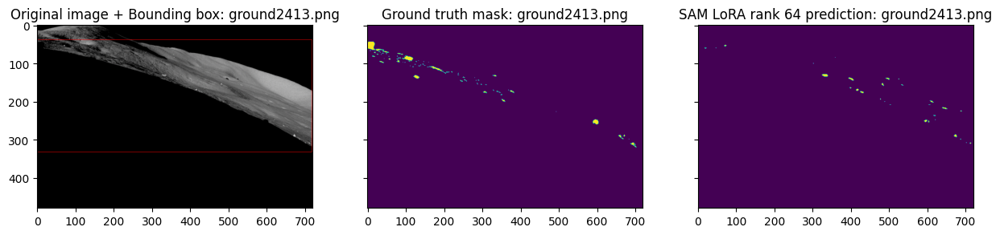

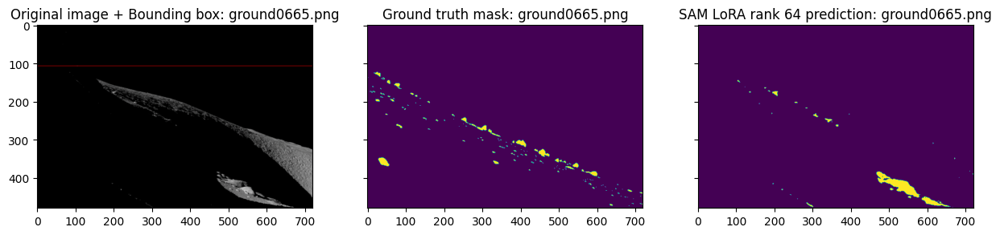

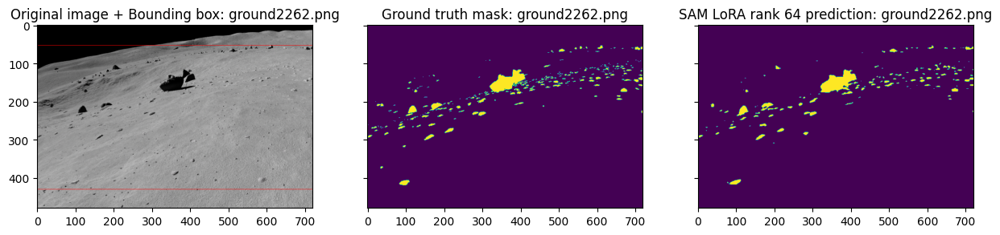

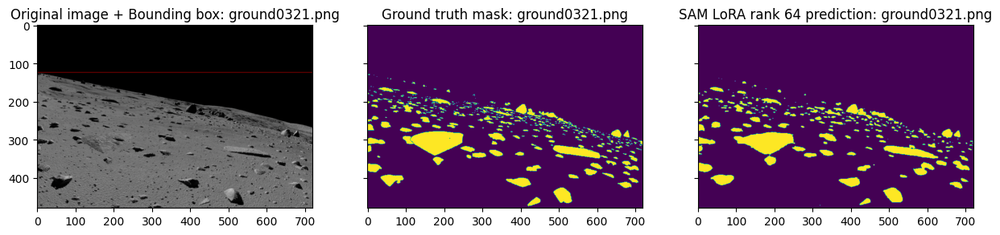

In [ ]:
import torch
import numpy as np
from src.segment_anything import build_sam_vit_b, SamPredictor, sam_model_registry
from src.processor import Samprocessor
from src.lora import LoRA_sam
from PIL import Image
import matplotlib.pyplot as plt
import src.utils as utils
from PIL import Image, ImageDraw
import yaml
import json
from torchvision.transforms import ToTensor

sam_checkpoint = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/sam_vit_b_01ec64.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"
sam = build_sam_vit_b(checkpoint=sam_checkpoint)
rank = 64
sam_lora = LoRA_sam(sam, rank)
sam_lora.load_lora_parameters("/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/lora_rank512.safetensors")
model = sam_lora.sam


def inference_model(sam_model, image_path, filename, mask_path=None, bbox=None, is_baseline=False):
    if is_baseline == False:
        model = sam_model.sam
        rank = sam_model.rank
    else:
        model = build_sam_vit_b(checkpoint=sam_checkpoint)

    model.eval()
    model.to(device)
    image = Image.open(image_path)
    if mask_path != None:
        mask = Image.open(mask_path)
        mask = mask.convert('1')
        ground_truth_mask =  np.array(mask)
        box = utils.get_bounding_box(ground_truth_mask)
    else:
        box = bbox

    predictor = SamPredictor(model)
    predictor.set_image(np.array(image))
    masks, iou_pred, low_res_iou = predictor.predict(
        box=np.array(box),
        multimask_output=False,
    )

    if mask_path == None:
        fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(100, 100))
        draw = ImageDraw.Draw(image)
        draw.rectangle(box, outline ="red")
        ax1.imshow(image)
        ax1.set_title(f"Original image + Bounding box: {filename}")

        ax2.imshow(masks[0])
        if is_baseline:
            ax2.set_title(f"Baseline SAM prediction: {filename}")
            plt.savefig(f"./plots/{filename}_baseline.png")
        else:
            ax2.set_title(f"SAM LoRA rank {rank} prediction: {filename}")
            plt.savefig(f"./plots/{filename[:-4]}_rank{rank}.png")

    else:
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(15, 15))
        draw = ImageDraw.Draw(image)
        draw.rectangle(box, outline ="red")
        ax1.imshow(image)
        ax1.set_title(f"Original image + Bounding box: {filename}")

        ax2.imshow(ground_truth_mask)
        ax2.set_title(f"Ground truth mask: {filename}")

        ax3.imshow(masks[0])
        if is_baseline:
            ax3.set_title(f"Baseline SAM prediction: {filename}")
            plt.savefig(f"./plots/{filename}_baseline.png")
        else:
            ax3.set_title(f"SAM LoRA rank {rank} prediction: {filename}")
            plt.savefig(f"./plots/{filename[:-4]}_rank{rank}.png")


# Open configuration file
with open("/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/config.yaml", "r") as ymlfile:
   config_file = yaml.load(ymlfile, Loader=yaml.Loader)

# Open annotation file
f = open('/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/dataset.json')
annotations = json.load(f)


train_set = annotations["train"]
test_set = annotations["test"]
inference_train = True

if inference_train:

    for image_name, dict_annot in train_set.items():
        image_path = f"/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/train/image/{image_name}"
        inference_model(sam_lora, image_path, filename=image_name, mask_path=dict_annot["mask_path"], bbox=dict_annot["bbox"], is_baseline=False)


else:

    for image_name, dict_annot in test_set.items():
        image_path = f"/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/image/{image_name}"
        inference_model(sam_lora, image_path, filename=image_name, mask_path=dict_annot["mask_path"], bbox=dict_annot["bbox"], is_baseline=False)

ojinal görsel üzerinde segmentleme

In [ ]:
def inference_model(sam_model, image_path, filename, mask_path=None, bbox=None, is_baseline=False):
    if is_baseline == False:
        model = sam_model.sam
        rank = sam_model.rank
    else:
        model = build_sam_vit_b(checkpoint=sam_checkpoint)

    model.eval()
    model.to(device)

    image = Image.open(image_path)
    original_image = image.copy()

    if mask_path != None:
        mask = Image.open(mask_path).convert('1')
        ground_truth_mask = np.array(mask)
        box = utils.get_bounding_box(ground_truth_mask)
    else:
        box = bbox

    predictor = SamPredictor(model)
    predictor.set_image(np.array(image))
    masks, iou_pred, low_res_iou = predictor.predict(
        box=np.array(box),
        multimask_output=False,
    )

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))

    draw = ImageDraw.Draw(original_image)
    draw.rectangle(box, outline="red")
    ax1.imshow(original_image)
    ax1.set_title(f"Original image + Bounding box: {filename}")

    ax2.imshow(original_image)
    ax2.imshow(masks[0], alpha=0.5, cmap='viridis')  # Adjust alpha for transparency
    if is_baseline:
        ax2.set_title(f"Baseline SAM prediction: {filename}")
    else:
        ax2.set_title(f"SAM LoRA rank {rank} prediction: {filename}")

    plt.show()


test

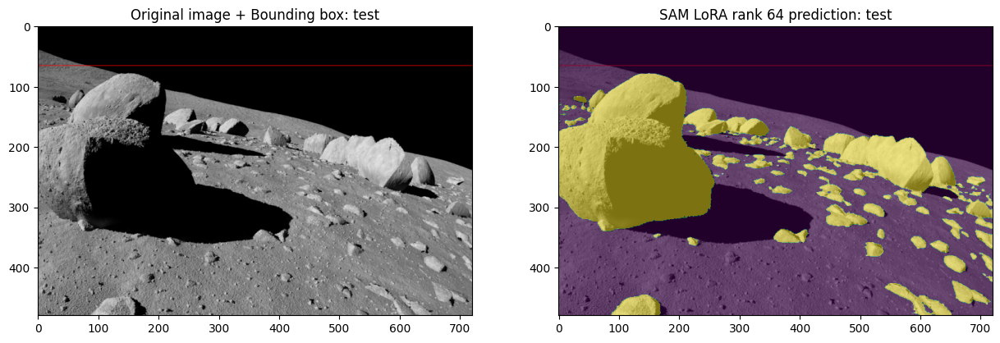

In [ ]:

image_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/image/ground0089.png"
filename = "test"
mask_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/mask/ground0089.png"
bbox = (2500, 2500, 1720, 2090)
is_baseline = False
inference_model(sam_lora, image_path, filename, mask_path, bbox, is_baseline)


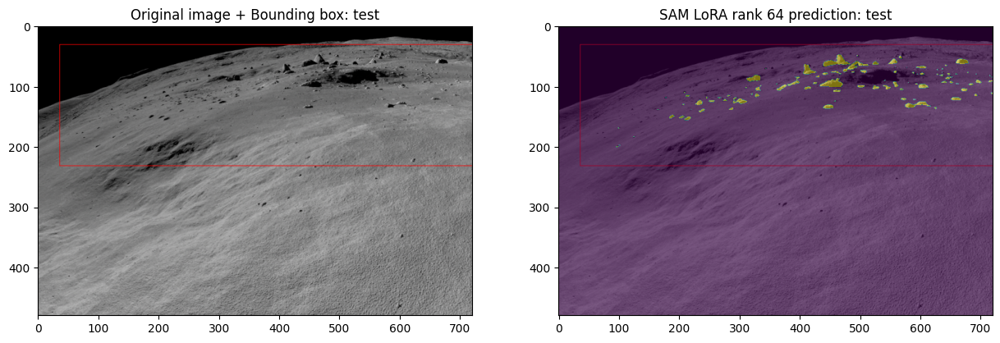

In [ ]:

image_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/image/ground0211.png"
filename = "test"
mask_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/mask/ground0211.png"
bbox = (2500, 2500, 1720, 2090)
is_baseline = False
inference_model(sam_lora, image_path, filename, mask_path, bbox, is_baseline)

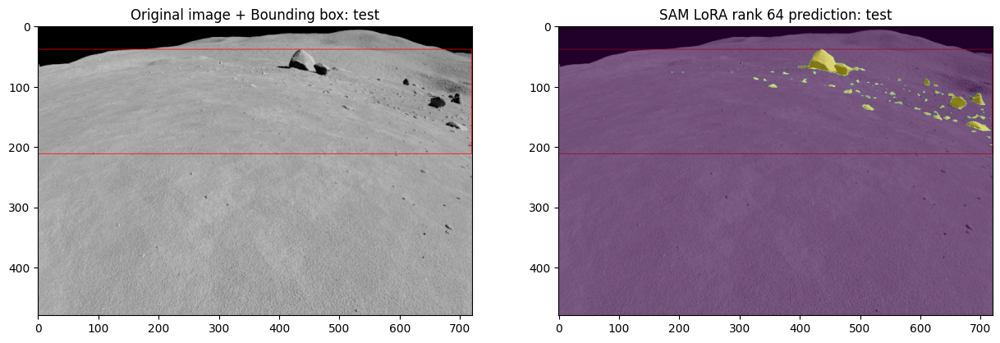

In [ ]:

image_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/image/ground1366.png"
filename = "test"
mask_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/mask/ground1366.png"
bbox = (2500, 2500, 1720, 2090)
is_baseline = False
inference_model(sam_lora, image_path, filename, mask_path, bbox, is_baseline)

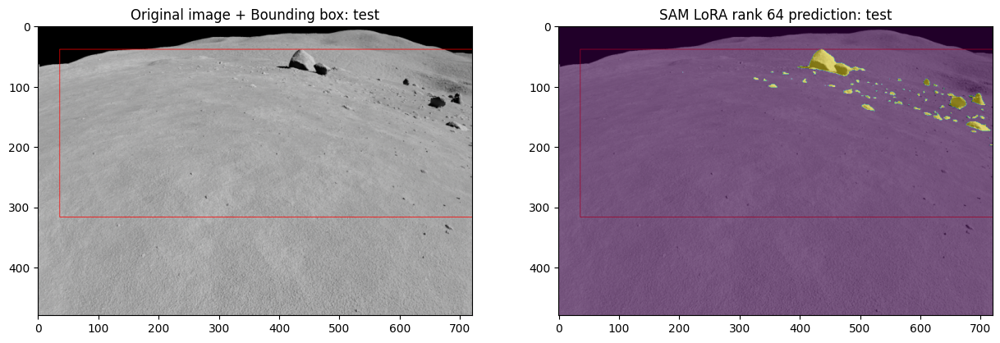

In [ ]:
image_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/image/ground1366.png"
filename = "test"
mask_path = "/content/drive/MyDrive/Sam_LoRA/Sam_LoRA/dataset/test/mask/ground4787.png"
bbox = (2500, 2500, 1720, 2090)
is_baseline = False
inference_model(sam_lora, image_path, filename, mask_path, bbox, is_baseline)